In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import sys
sys.path.append('/content/drive/My Drive/Colab Notebooks')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split, learning_curve, cross_val_score, RandomizedSearchCV
from sklearn import svm
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import RFECV
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, roc_curve, auc, ConfusionMatrixDisplay, f1_score
from sklearn.metrics import r2_score
from sklearn.calibration import calibration_curve
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report

In [ ]:
# import os, sys
# from google.colab import drive
# drive.mount('/content/drive')
# nb_path = '/content/drive/MyDrive/Library'
# os.symlink('/content/drive/My Drive/Colab Notebooks', nb_path)
# sys.path.insert(0, nb_path)  

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# !pip install --target=$nb_path shap

In [ ]:
# !pip install --target=$nb_path eli5

In [ ]:
# !pip install --target=$nb_path pdpbox

In [ ]:
from xgboost import XGBClassifier
from math import sqrt
import shap
from pdpbox import pdp, info_plots
import eli5
from eli5.sklearn import PermutationImportance
from mpl_toolkits.mplot3d import Axes3D
from collections import OrderedDict

In [ ]:
import os
os.chdir('/content/drive/MyDrive')

In [ ]:
data = pd.read_csv('ML.csv', index_col = 0)

In [ ]:
data.shape

(1593, 43)

In [ ]:
X = data.iloc[:, :-1]
y = data.iloc[:, -1]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=209)

In [ ]:
X_train.shape

(1194, 42)

In [ ]:
X_test.shape

(399, 42)

In [ ]:
pca = PCA(n_components = 3)
data_pca = pca.fit_transform(X)

Text(0.5, 0.92, 'PCA of Patient in 3 Dimentional Space')

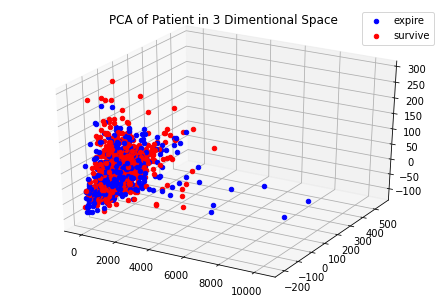

In [ ]:
fig = plt.figure()
ax = Axes3D(fig)
for i in range(X.shape[0]):
    if y.iloc[i] == 1:
        ax.scatter(data_pca[i, 0], data_pca[i, 1], data_pca[i, 2], color = 'b', label = 'expire')
    else:
        ax.scatter(data_pca[i, 0], data_pca[i, 1], data_pca[i, 2], color = 'r', label = 'survive')
        
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.title('PCA of Patient in 3 Dimentional Space')

In [ ]:
tsne = TSNE(n_components = 3)
data_tsne = tsne.fit_transform(X)

Text(0.5, 0.92, 'T-SNE of Patient in 3 Dimentional Space')

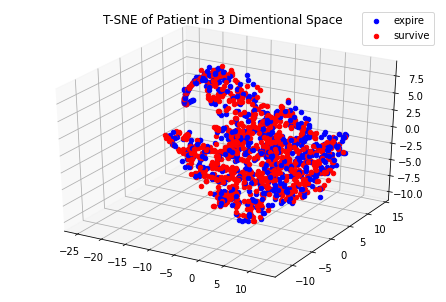

In [ ]:
fig = plt.figure()
ax = Axes3D(fig)
for i in range(X.shape[0]):
    if y.iloc[i] == 1:
        ax.scatter(data_tsne[i, 0], data_tsne[i, 1], data_tsne[i, 2], color = 'b', label = 'expire')
    else:
        ax.scatter(data_tsne[i, 0], data_tsne[i, 1], data_tsne[i, 2], color = 'r', label = 'survive')
        
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.title('T-SNE of Patient in 3 Dimentional Space')

In [ ]:
# Modeling

In [ ]:
knn = KNeighborsClassifier()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
mlp = MLPClassifier()
xgb = XGBClassifier()
svc = svm.SVC( probability=True)
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
rfecv_xgb = RFECV(xgb)
rfecv_gb = RFECV(gb)

In [ ]:
# set searching parameters for each variable
param_knn = {'n_neighbors': np.arange(3, 7),
                  'weights': ['uniform', 'distance'], 
                  'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}
param_rf = {'n_estimators': np.arange(50, 150),
            'criterion': ['gini', 'entropy', 'log_loss'],
            'min_samples_leaf': np.arange(0, 3),
            'max_features': ['sqrt', 'log2', np.arange(0, 1, 0.1)]}
param_dt = {'criterion': ['gini', 'entropy', 'log_loss'],
            'min_samples_leaf': np.arange(0, 3),
            'max_features': ['sqrt', 'log2', np.arange(0, 1, 0.1)]}
param_mlp = {'hidden_layer_sizes': [(100,), (75,), (50,)],
             'activation': ['identity', 'logistic', 'tanh', 'relu'],
             'solver': ['lbfgs', 'sgd', 'adam'],
             'alpha': np.arange(0, 0.0005, 0.0001),
             'batch_size': np.arange(100, 200)}
param_svc = {'C': np.arange(0.5, 1.5, 0.1),
             'kernel': ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed']}
param_gb = {'loss': ['log_loss', 'deviance', 'exponential'],
                 'learning_rate': np.arange(0, 0.3, 0.1),
                 'n_estimators': np.arange(50, 150),
                 'criterion': ['friedman_mse', 'squared_error', 'mse']}
param_xgb = {'max_depth': np.arange(1, 5),
             'learning_rate': np.arange(0.05, 0.15, 0.02),
             'n_estimators' : np.arange(50, 150)}
param_rfecv_gb = {'step': np.arange(1, 3)}
param_rfecv_xgb = {'step': np.arange(1, 3)}
param_ada = {'n_estimators' : np.arange(25, 100),
             'learning_rate': np.arange(0.5, 1.5, 0.1),
             'algorithm': ['SAMME', 'SAMME.R']}


In [ ]:
# define RandomizedSearchCV function
def RS(estimator, param):
  searcher = RandomizedSearchCV(estimator, param, scoring = 'f1', random_state = 7)
  searcher.fit(X_train, y_train)
  print('\n')
  print('Searching results of ' + str(estimator))
  print(searcher.best_params_)

In [ ]:
RS(knn, param_knn)
RS(rf, param_rf)
RS(dt, param_dt)
RS(mlp, param_mlp)
RS(svc, param_svc)
RS(gb, param_gb)
RS(xgb, param_xgb)
RS(rfecv_gb, param_rfecv_gb)
RS(rfecv_xgb, param_rfecv_xgb)
RS(ada, param_ada)



Searching results of RFECV(estimator=GradientBoostingClassifier())
{'step': 1}


Searching results of RFECV(estimator=XGBClassifier())
{'step': 2}


Searching results of AdaBoostClassifier()
{'n_estimators': 77, 'learning_rate': 1.0999999999999999, 'algorithm': 'SAMME'}


In [ ]:
# modeling with optimal paramaters
knn = KNeighborsClassifier(weights ='distance', n_neighbors = 3, algorithm = 'auto')
rf = RandomForestClassifier(n_estimators = 87, min_samples_leaf = 2, max_features = 'log2', criterion = 'gini')
dt = DecisionTreeClassifier(min_samples_leaf = 1, max_features = 'sqrt', criterion = 'gini')
mlp = MLPClassifier(solver = 'lbfgs', hidden_layer_sizes = (100,), batch_size = 187, alpha = 0.0002, activation = 'identity')
xgb = XGBClassifier(n_estimators = 122, max_depth = 2, learning_rate = 0.11000000000000001)
svc = svm.SVC( probability=True, kernel = 'rbf', C = 1.0999999999999999)
ada = AdaBoostClassifier(n_estimators = 77, learning_rate = 1.0999999999999999, algorithm = 'SAMME')
gb = GradientBoostingClassifier(n_estimators = 100, loss = 'deviance', learning_rate = 0.2, criterion = 'mse')
rfecv_xgb = RFECV(xgb, step = 2)
rfecv_gb = RFECV(gb, step = 1)

In [ ]:
def Train_model(estimator, X, y):
    estimator.fit(X, y)

In [ ]:
Train_model(knn, X_train, y_train)
Train_model(rf, X_train, y_train)
Train_model(dt, X_train, y_train)
Train_model(mlp, X_train, y_train)
Train_model(xgb, X_train, y_train)
Train_model(svc, X_train, y_train)
Train_model(ada, X_train, y_train)
Train_model(gb, X_train, y_train)
Train_model(rfecv_xgb, X_train, y_train)
Train_model(rfecv_gb, X_train, y_train)

In [ ]:
for i in range(10):
    if  [i for i in rfecv_xgb.ranking_][i] == 1:
        print([i for i in rfecv_xgb.feature_names_in_][i])

In [ ]:
# Learning Curve
def plot_learning_curve(estimator, X, y, label):
    train_set_size, train_scores, test_scores = learning_curve(estimator, X, y, cv = None)
    plt.plot(train_set_size,train_scores.mean(axis=1), '--', label = label + '  train scores')
    plt.plot(train_set_size,test_scores.mean(axis=1), '-', label = label + '  test scores')
    plt.xlabel('Train Set Size')
    plt.ylabel('Score')
    plt.legend(loc='upper left')

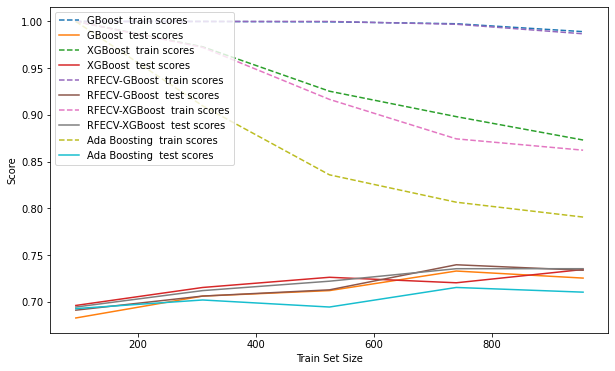

In [ ]:
plt.figure(figsize = (10, 6))
plot_learning_curve(gb, X_train, y_train, 'GBoost')
plot_learning_curve(xgb, X_train, y_train, 'XGBoost')
plot_learning_curve(rfecv_gb, X_train, y_train, 'RFECV-GBoost')
plot_learning_curve(rfecv_xgb, X_train, y_train, 'RFECV-XGBoost')
plot_learning_curve(ada, X_train, y_train, 'Ada Boosting')

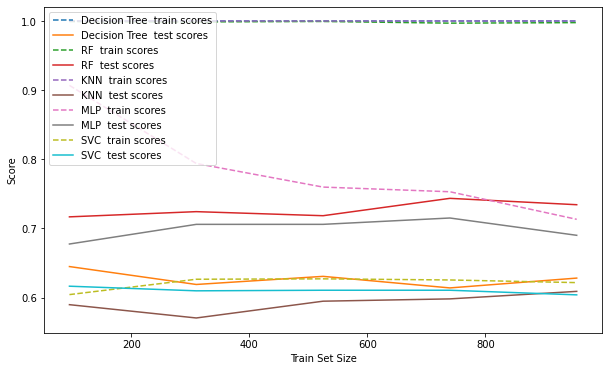

In [ ]:
plt.figure(figsize = (10, 6))
plot_learning_curve(dt, X_train, y_train, 'Decision Tree')
plot_learning_curve(rf, X_train, y_train, 'RF')
plot_learning_curve(knn, X_train, y_train, 'KNN')
plot_learning_curve(mlp, X_train, y_train, 'MLP')
plot_learning_curve(svc, X_train, y_train, 'SVC')

In [ ]:
# ROC Curve and area under curve
def ROC(estimator, X, y, label):
    y_pre = estimator.predict_proba(X)[:,1]
    fpr, tpr, thersholds = roc_curve(y, y_pre, pos_label=1)

    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label = label +' (AUC = {0:.2f})'.format(roc_auc), lw=2)
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')

    plt.xlim([-0.05, 1.05]) 
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate') 
    plt.title('ROC Curve')
    plt.legend(loc="lower right")

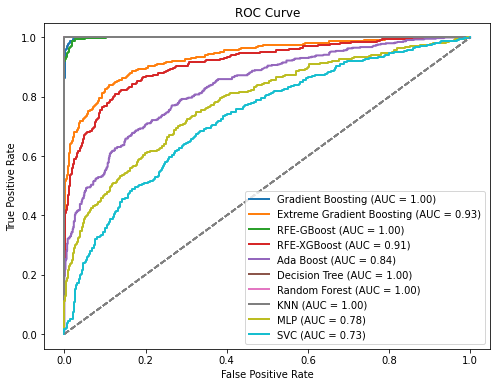

In [ ]:
plt.figure(figsize = (8, 6))
ROC(gb, X_train, y_train, 'Gradient Boosting')
ROC(xgb, X_train, y_train, 'Extreme Gradient Boosting')
ROC(rfecv_gb, X_train, y_train, 'RFE-GBoost')
ROC(rfecv_xgb, X_train, y_train, 'RFE-XGBoost')
ROC(ada, X_train, y_train, 'Ada Boost')
ROC(dt, X_train, y_train, 'Decision Tree')
ROC(rf, X_train, y_train, 'Random Forest')
ROC(knn, X_train, y_train, 'KNN')
ROC(mlp, X_train, y_train, 'MLP')
ROC(svc, X_train, y_train, 'SVC')


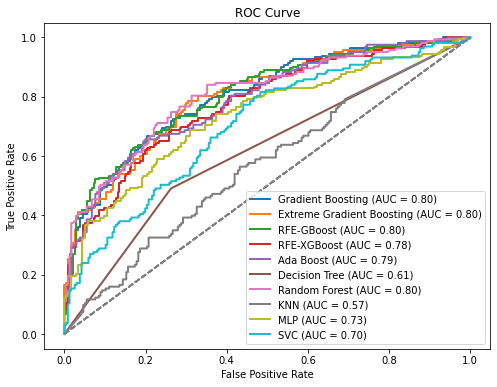

In [ ]:
plt.figure(figsize = (8, 6))
ROC(gb, X_test, y_test, 'Gradient Boosting')
ROC(xgb, X_test, y_test, 'Extreme Gradient Boosting')
ROC(rfecv_gb, X_test, y_test, 'RFE-GBoost')
ROC(rfecv_xgb, X_test, y_test, 'RFE-XGBoost')
ROC(ada, X_test, y_test, 'Ada Boost')
ROC(dt, X_test, y_test, 'Decision Tree')
ROC(rf, X_test, y_test, 'Random Forest')
ROC(knn, X_test, y_test, 'KNN')
ROC(mlp, X_test, y_test, 'MLP')
ROC(svc, X_test, y_test, 'SVC')


In [ ]:
# Calibration Curve
def Calibration_Curve(estimator, X, y, label):
    y_pre = estimator.predict_proba(X)[:,1]
    obs, pred = calibration_curve(y, y_pre, n_bins = 5)

    plt.plot(pred, obs, label = label, lw=2)
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')

    plt.xlim([-0.05, 1.05]) 
    plt.ylim([-0.05, 1.05])
    plt.xlabel('Predicted Probability')
    plt.ylabel('Observed Probability') 
    plt.title('Calibration Curve')
    plt.legend(loc="lower right")

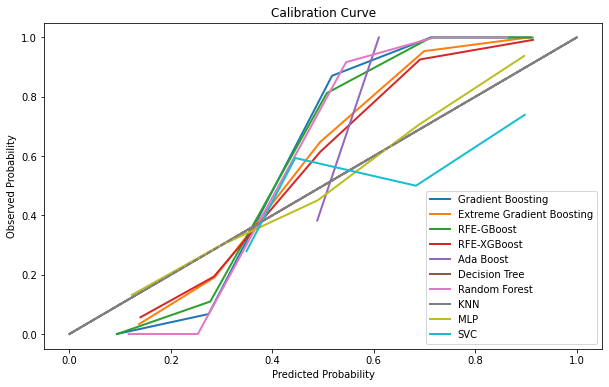

In [ ]:
plt.figure(figsize = (10,6))
Calibration_Curve(gb, X_train, y_train, 'Gradient Boosting')
Calibration_Curve(xgb, X_train, y_train, 'Extreme Gradient Boosting')
Calibration_Curve(rfecv_gb, X_train, y_train, 'RFE-GBoost')
Calibration_Curve(rfecv_xgb, X_train, y_train, 'RFE-XGBoost')
Calibration_Curve(ada, X_train, y_train, 'Ada Boost')
Calibration_Curve(dt, X_train, y_train, 'Decision Tree')
Calibration_Curve(rf, X_train, y_train, 'Random Forest')
Calibration_Curve(knn, X_train, y_train, 'KNN')
Calibration_Curve(mlp, X_train, y_train, 'MLP')
Calibration_Curve(svc, X_train, y_train, 'SVC')


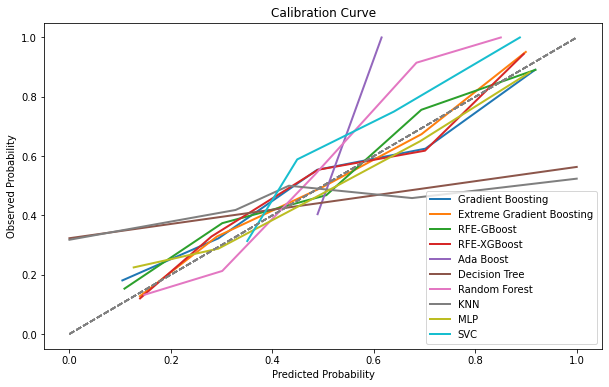

In [ ]:
plt.figure(figsize = (10,6))
Calibration_Curve(gb, X_test, y_test, 'Gradient Boosting')
Calibration_Curve(xgb, X_test, y_test, 'Extreme Gradient Boosting')
Calibration_Curve(rfecv_gb, X_test, y_test, 'RFE-GBoost')
Calibration_Curve(rfecv_xgb, X_test, y_test, 'RFE-XGBoost')
Calibration_Curve(ada, X_test, y_test, 'Ada Boost')
Calibration_Curve(dt, X_test, y_test, 'Decision Tree')
Calibration_Curve(rf, X_test, y_test, 'Random Forest')
Calibration_Curve(knn, X_test, y_test, 'KNN')
Calibration_Curve(mlp, X_test, y_test, 'MLP')
Calibration_Curve(svc, X_test, y_test, 'SVC')

In [ ]:
# Classification report
def Classification_report(estimator):
  y_pred = estimator.predict(X_test)
  print('\n' + str(estimator) + '\n')
  print(classification_report(y_test, y_pred, target_names = ['survive', 'expire']))

In [ ]:
Classification_report(gb)
Classification_report(xgb)
Classification_report(rfecv_gb)
Classification_report(rfecv_xgb)
Classification_report(ada)
Classification_report(dt)
Classification_report(rf)
Classification_report(knn)
Classification_report(mlp)
Classification_report(svc)



GradientBoostingClassifier(criterion='mse', learning_rate=0.2)

              precision    recall  f1-score   support

     survive       0.73      0.87      0.79       236
      expire       0.74      0.54      0.62       163

    accuracy                           0.73       399
   macro avg       0.74      0.70      0.71       399
weighted avg       0.74      0.73      0.72       399


XGBClassifier(learning_rate=0.11000000000000001, max_depth=2, n_estimators=122)

              precision    recall  f1-score   support

     survive       0.73      0.87      0.79       236
      expire       0.74      0.54      0.62       163

    accuracy                           0.73       399
   macro avg       0.74      0.70      0.71       399
weighted avg       0.74      0.73      0.72       399


RFECV(estimator=GradientBoostingClassifier(criterion='mse', learning_rate=0.2))

              precision    recall  f1-score   support

     survive       0.74      0.87      0.80       236
      ex

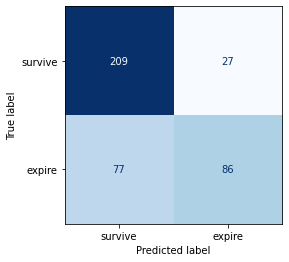

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(
        rf,
        X_test,
        y_test,
        display_labels=['survive', 'expire'],
        cmap=plt.cm.Blues,
        colorbar = False
    )

In [ ]:
# Cross Validation
def Cross_validation(estimator):
  scores = cross_val_score(estimator, X_train, y_train, cv=5)
  print('5-fold Cross validation of ' + str(estimator) + str(scores))

In [ ]:
Cross_validation(gb)
Cross_validation(xgb)
Cross_validation(rfecv_gb)
Cross_validation(rfecv_xgb)
Cross_validation(ada)
Cross_validation(dt)
Cross_validation(rf)
Cross_validation(knn)
Cross_validation(mlp)
Cross_validation(svc)


5-fold Cross validation of GradientBoostingClassifier(criterion='mse', learning_rate=0.2)[0.72384937 0.74476987 0.75732218 0.72803347 0.69747899]
5-fold Cross validation of XGBClassifier(learning_rate=0.11000000000000001, max_depth=2, n_estimators=122)[0.72803347 0.77824268 0.75732218 0.74058577 0.66806723]
5-fold Cross validation of RFECV(estimator=GradientBoostingClassifier(criterion='mse', learning_rate=0.2))[0.71548117 0.72803347 0.75732218 0.71966527 0.71428571]
5-fold Cross validation of RFECV(estimator=XGBClassifier(learning_rate=0.11000000000000001, max_depth=2,
                              n_estimators=122),
      step=2)[0.73221757 0.77824268 0.73221757 0.74476987 0.68067227]
5-fold Cross validation of AdaBoostClassifier(algorithm='SAMME', learning_rate=1.0999999999999999,
                   n_estimators=77)[0.72384937 0.74476987 0.69456067 0.71129707 0.69327731]
5-fold Cross validation of DecisionTreeClassifier(max_features='sqrt')[0.60669456 0.68619247 0.63179916 0.6192468

In [ ]:
#RF visualization
estimator = rf.estimators_[10]
feature_names = [i for i in rf.feature_names_in_]

In [ ]:
export_graphviz(
    estimator, 
    out_file='tree1.dot', 
    feature_names = feature_names, 
    class_names = ['survive', 'expire'],  
    rounded = True, 
    proportion = True, 
    label='root',
    precision = 2, 
    filled = True
)

from subprocess import call
call(['dot', '-Tpng', 'tree1.dot', '-o', 'tree1.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree1.png')

In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(dt)
shap_values = explainer.shap_values(X_train.iloc[:50])
shap.force_plot(explainer.expected_value[1], 
                shap_values[1], 
                X_test.iloc[:50])

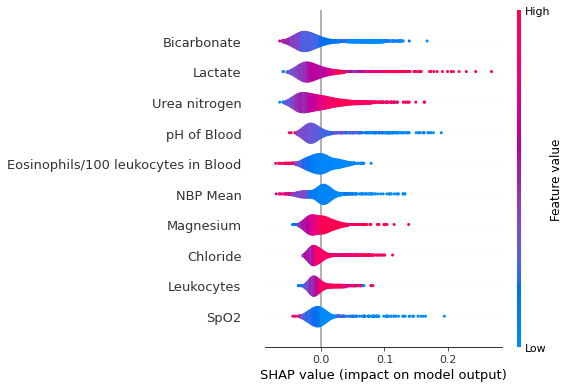

In [ ]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values[1], X_train, plot_type = 'violin', max_display = 10)

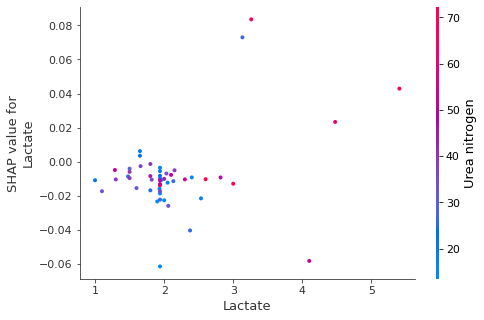

In [ ]:
# shap_values = explainer.shap_values(X_test)
shap.dependence_plot('Lactate', shap_values[1], X_train.iloc[:50, ], interaction_index = 'Urea nitrogen')

In [ ]:
# Single patient variance
def heart_failure_risk_factors(model, patient):

    explainer = shap.TreeExplainer(model) 
    shap_values = explainer.shap_values(patient)
    shap.initjs()
    return shap.force_plot(
      explainer.expected_value[1],
      shap_values[1], 
      patient)

In [ ]:
patient = X_test.iloc[358, :]
heart_failure_risk_factors(rf, patient)

In [ ]:
patient = X_test.iloc[308, :]
heart_failure_risk_factors(rf, patient)

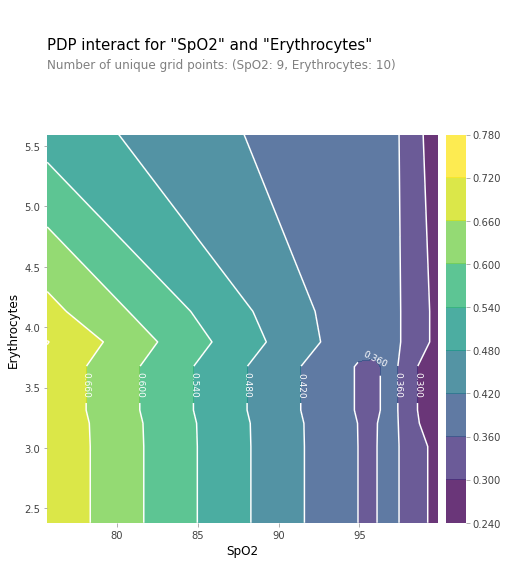

In [ ]:
# 2 Dimentional Partial dependence plots ，2-D PDP
inter1  =  pdp.pdp_interact(
    model=gb, 
    dataset=X_test, 
    model_features=gb.feature_names_in_,  
    features=['SpO2', 'Erythrocytes'])

pdp.pdp_interact_plot(
    pdp_interact_out=inter1, 
    feature_names=['SpO2', 'Erythrocytes'], 
    plot_type='contour')
plt.show()


In [ ]:
# Feature Importance
perm = PermutationImportance(rf).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top = 10)

Weight,Feature
0.0155 ± 0.0160,NBP Mean
0.0150 ± 0.0090,Lactate
0.0085 ± 0.0117,Temperature
0.0080 ± 0.0058,Erythrocytes
0.0060 ± 0.0093,Lymphocytes/100 leukocytes in Blood
0.0040 ± 0.0184,Leukocytes
0.0040 ± 0.0263,Bicarbonate
0.0030 ± 0.0120,SpO2
0.0025 ± 0.0084,diabetes_complicated
0.0020 ± 0.0092,Carbon dioxide in Blood


In [ ]:
# Feature Importance
perm = PermutationImportance(gb).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top = 10)

Weight,Feature
0.0286 ± 0.0117,Lactate
0.0241 ± 0.0133,NBP Mean
0.0201 ± 0.0217,Bicarbonate
0.0145 ± 0.0116,SpO2
0.0120 ± 0.0086,Urea nitrogen
0.0075 ± 0.0267,Temperature
0.0075 ± 0.0256,Prothrombin time in Blood
0.0075 ± 0.0165,pH of Blood
0.0075 ± 0.0131,Calcium
0.0075 ± 0.0045,diabetes_complicated


In [ ]:
perm = PermutationImportance(xgb).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top = 10)

Weight,Feature
0.0236 ± 0.0140,SpO2
0.0216 ± 0.0181,NBP Mean
0.0216 ± 0.0129,Lactate
0.0180 ± 0.0196,Urea nitrogen
0.0175 ± 0.0131,Platelets
0.0110 ± 0.0121,Temperature
0.0105 ± 0.0058,Glucose
0.0090 ± 0.0040,Erythrocytes
0.0090 ± 0.0081,Calcium
0.0065 ± 0.0060,Heart Rate


In [ ]:
# perm = PermutationImportance(rfecv_xgb).fit(X_test, y_test)
# eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top = 10)

Weight,Feature
0.0291 ± 0.0175,Lactate
0.0190 ± 0.0223,SpO2
0.0165 ± 0.0081,Bicarbonate
0.0150 ± 0.0114,pH of Blood
0.0145 ± 0.0211,Eosinophils/100 leukocytes in Blood
0.0140 ± 0.0068,NBP Mean
0.0105 ± 0.0140,Platelets
0.0085 ± 0.0087,Calcium
0.0070 ± 0.0178,Urea nitrogen
0.0070 ± 0.0147,Magnesium


In [ ]:
perm = PermutationImportance(ada).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top = 10)

Weight,Feature
0.0401 ± 0.0261,Bicarbonate
0.0336 ± 0.0133,NBP Mean
0.0251 ± 0.0168,Eosinophils/100 leukocytes in Blood
0.0175 ± 0.0138,Lactate
0.0170 ± 0.0209,SpO2
0.0140 ± 0.0243,Magnesium
0.0135 ± 0.0081,Platelets
0.0120 ± 0.0140,pH of Blood
0.0080 ± 0.0080,Leukocytes
0.0075 ± 0.0131,Temperature


In [ ]:
perm = PermutationImportance(rfecv_gb).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top = 10)

Weight,Feature
0.0291 ± 0.0212,Lactate
0.0190 ± 0.0181,Bicarbonate
0.0145 ± 0.0223,NBP Mean
0.0110 ± 0.0160,Eosinophils/100 leukocytes in Blood
0.0085 ± 0.0140,Calcium
0.0055 ± 0.0191,pH of Blood
0.0055 ± 0.0189,Urea nitrogen
0.0055 ± 0.0058,Respiratory Rate
0.0045 ± 0.0183,SpO2
0.0045 ± 0.0049,Heart Rate


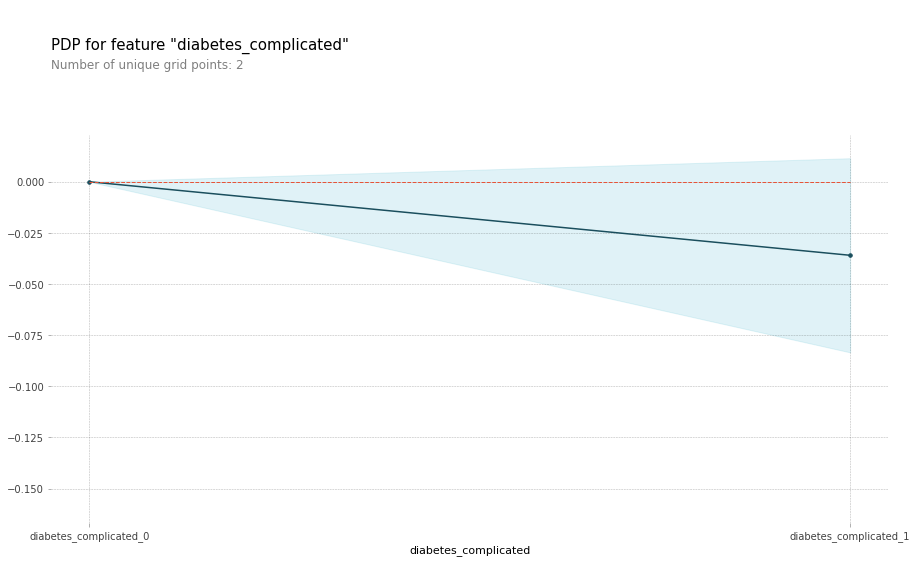

In [ ]:
# Partial dependence plots ，PDP
base_features = X.columns.values.tolist()

feat_name = 'diabetes_complicated'  
pdp_dist = pdp.pdp_isolate(
    model=gb,  
    dataset=X_test,  
    model_features=base_features,  
    feature=feat_name
)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

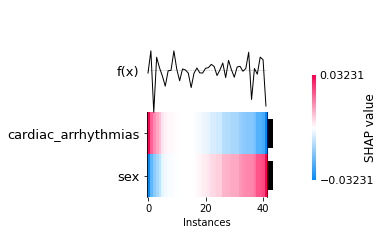

In [ ]:
explainer = shap.Explainer(rf, X_train)
shap.initjs()
shap_values = explainer(X_train, check_additivity = False)
shap.plots.heatmap(shap_values[1])

In [ ]:
help(shap.plots.heatmap)

Help on function heatmap in module shap.plots._heatmap:

heatmap(shap_values, instance_order=shap.Explanation.hclust, feature_values=shap.Explanation.abs.mean(0), feature_order=None, max_display=10, cmap=<matplotlib.colors.LinearSegmentedColormap object at 0x7fa2d38964d0>, show=True, plot_width=8)
    Create a heatmap plot of a set of SHAP values.
    
    This plot is designed to show the population substructure of a dataset using supervised
    clustering and a heatmap. Supervised clustering involves clustering data points not by their original
    feature values but by their explanations. By default we cluster using shap.utils.hclust_ordering
    but any clustering can be used to order the samples.
    
    Parameters
    ----------
    shap_values : shap.Explanation
        A multi-row Explanation object that we want to visualize in a cluster ordering.
    
    instance_order : OpChain or numpy.ndarray
        A function that returns a sort ordering given a matrix of SHAP values an